In [34]:
#Necessary so that each cell can produce multiple outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## 4.2.1: Introduction to GPS Tracking of Birds
***
- Learn how __GPS data__ can be used to __track bird migration__ patterns

In [3]:
import pandas as pd
birddata = pd.read_csv('/Users/ashishsrivastava/Desktop/Central/Python/HarvardX_PH526x/week_4/week_4_case_studies/4.2_bird_migration/bird_tracking.csv')

# or using the online file
# birddata = pd.read_csv('https://courses.edx.org/assets/courseware/v1/6184eb0f87c7b58db1a5c336e436ed09/asset-v1:HarvardX+PH526x+1T2020+type@asset+block/bird_tracking.csv')

birddata.info()
birddata.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61920 entries, 0 to 61919
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          61920 non-null  int64  
 1   altitude            61920 non-null  int64  
 2   date_time           61920 non-null  object 
 3   device_info_serial  61920 non-null  int64  
 4   direction           61477 non-null  float64
 5   latitude            61920 non-null  float64
 6   longitude           61920 non-null  float64
 7   speed_2d            61477 non-null  float64
 8   bird_name           61920 non-null  object 
dtypes: float64(4), int64(3), object(2)
memory usage: 4.3+ MB


,Unnamed: 0,altitude,date_time,device_info_serial,direction,latitude,longitude,speed_2d,bird_name
0,0,71,2013-08-15 00:18:08+00,851,-150.469753,49.419860,2.120733,0.150000,Eric
1,1,68,2013-08-15 00:48:07+00,851,-136.151141,49.419880,2.120746,2.438360,Eric
2,2,68,2013-08-15 01:17:58+00,851,160.797477,49.420310,2.120885,0.596657,Eric
3,3,73,2013-08-15 01:47:51+00,851,32.769360,49.420359,2.120859,0.310161,Eric
4,4,69,2013-08-15 02:17:42+00,851,45.191230,49.420331,2.120887,0.193132,Eric


## 4.2.2: Simple Data Visualizations
***
- Learn how to plot __latitude and longitude__ on a simple 2D plot

<Figure size 504x504 with 0 Axes>

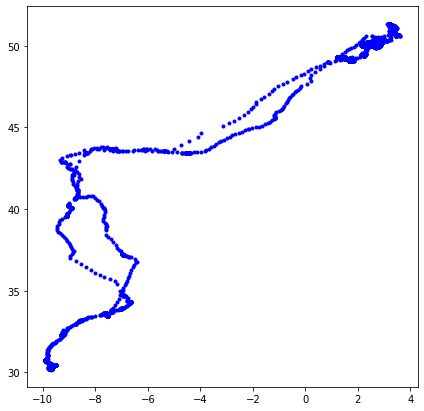

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Extract rows of dataframe for Eric
ix = birddata.bird_name == 'Eric'
x, y = birddata.longitude[ix], birddata.latitude[ix]

# plot it
plt.figure(figsize = (7,7))
plt.plot(x,y,'b.')

Now let's plot trajectories for all 3 birds in a single plot:

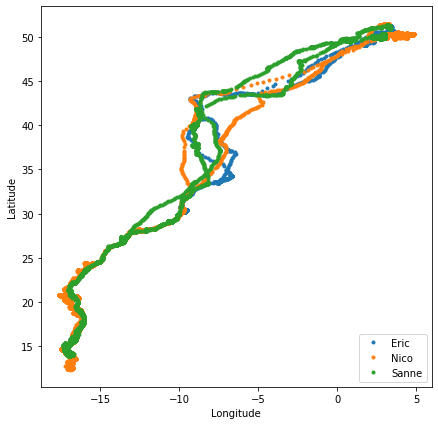

In [17]:
bird_names = pd.unique(birddata.bird_name)
bird_names
# our code will be the same as before, we're just looping over all 3 birds:
plt.figure(figsize = (7,7));
for bird_name in bird_names: 
    ix = birddata.bird_name == bird_name   
    x, y = birddata.longitude[ix], birddata.latitude[ix]
    plt.plot(x,y,'.', label = bird_name);
plt.xlabel('Longitude');
plt.ylabel('Latitude');
plt.legend(loc = 'lower right');
plt.savefig('3traj.pdf');


## 4.2.3: Examining Flight Speed
***
- Learn how to examine __2D flight speed__ of the birds
- Learn how to deal with data entries that are __not numeric__

(array([1.7732e+04, 1.5020e+03, 3.6900e+02, 7.8000e+01, 1.2000e+01,
        7.0000e+00, 3.0000e+00, 2.0000e+00, 3.0000e+00, 2.0000e+00]),
 array([ 0.        ,  6.34880658, 12.69761316, 19.04641974, 25.39522632,
        31.7440329 , 38.09283948, 44.44164607, 50.79045265, 57.13925923,
        63.48806581]),
 <a list of 10 Patch objects>)

True

85

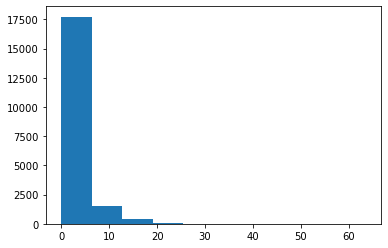

In [29]:
ix = birddata.bird_name == 'Eric'
speed = birddata.speed_2d[ix]
plt.hist(speed)
#This isn't right, there's an error. speed[:10] shows all numbers and produces a proper graph, so let's look for non number objects

# is any of the output true? Yes. There is at least one NaNd
np.isnan(speed).any()

#how many?
sum(np.isnan(speed))
#85 entries, which are causing the problems with the histogram

We only want to include the values that are numbers. We can start by finding the NaNs in the speed array

In [36]:
ind = np.isnan(speed)
ind
# take a bitwise complement of the ind array which turns each true -> false and vice versa
~ind


0        False
1        False
2        False
3        False
4        False
         ...  
19790    False
19791    False
19792    False
19793    False
19794    False
Name: speed_2d, Length: 19795, dtype: bool

0        True
1        True
2        True
3        True
4        True
         ... 
19790    True
19791    True
19792    True
19793    True
19794    True
Name: speed_2d, Length: 19795, dtype: bool

Now we're ready to plot a histogram:

(array([1.7732e+04, 1.5020e+03, 3.6900e+02, 7.8000e+01, 1.2000e+01,
        7.0000e+00, 3.0000e+00, 2.0000e+00, 3.0000e+00, 2.0000e+00]),
 array([ 0.        ,  6.34880658, 12.69761316, 19.04641974, 25.39522632,
        31.7440329 , 38.09283948, 44.44164607, 50.79045265, 57.13925923,
        63.48806581]),
 <a list of 10 Patch objects>)

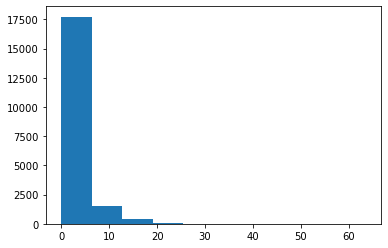

In [38]:
ix = birddata.bird_name == 'Eric'
speed = birddata.speed_2d[ix]
ind = np.isnan(speed)
#only those entries for which ind is false (the numbers)
plt.hist(speed[~ind])
plt.savefig('hist.pdf')

We can tweak the code and make the following adjustments:
- add an xlabel, ylabel, specify the locations of the bins, and normalize the histogram


<Figure size 576x288 with 0 Axes>

(array([3.95708699e-01, 1.11929308e-01, 3.99150204e-02, 2.23858616e-02,
        1.70145413e-02, 1.32514008e-02, 1.02923501e-02, 7.84791698e-03,
        4.69588475e-03, 3.37717739e-03, 2.28361519e-03, 1.76899768e-03,
        8.68417043e-04, 7.71926261e-04, 4.82453913e-04, 3.85963130e-04,
        2.57308754e-04, 9.64907826e-05, 0.00000000e+00]),
 array([ 0.        ,  1.57894737,  3.15789474,  4.73684211,  6.31578947,
         7.89473684,  9.47368421, 11.05263158, 12.63157895, 14.21052632,
        15.78947368, 17.36842105, 18.94736842, 20.52631579, 22.10526316,
        23.68421053, 25.26315789, 26.84210526, 28.42105263, 30.        ]),
 <a list of 19 Patch objects>)

Text(0.5, 0, '2D speed (m/s)')

Text(0, 0.5, 'Frequency')

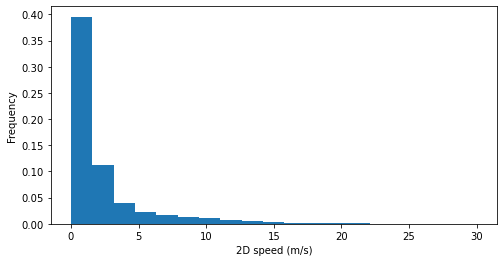

In [52]:
plt.figure(figsize = (8,4))
speed = birddata.speed_2d[birddata.bird_name == 'Eric']
ind = np.isnan(speed)
#Note: normed = True no longer works, so you have to use density = True instead
plt.hist(speed[~ind], bins = np.linspace(0, 30, 20), density = True)
plt.xlabel('2D speed (m/s)')
plt.ylabel('Frequency')

Pandas also provides plotting functions:
 - Through less customizeable than plt, they readily deal with NaNs. You want to still make sure that you always examine your data carefully, and look for the existence of NaNs before you start plotting

Text(0.5, 0, '2D speed')

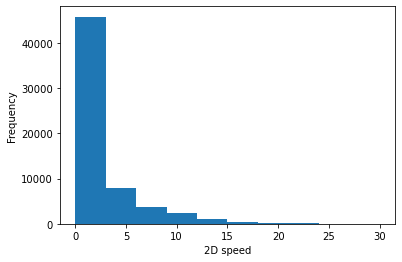

In [53]:
birddata.speed_2d.plot(kind='hist', range = [0,30])
plt.xlabel('2D speed')
plt.savefig('pd_hist.pdf')

## 4.2.4: Using Datetime
***
- Learn how deal with __timestamped__ data using datetime
- Learn how to measure __elapsed time__

In [55]:
# note that there is a date_time column for timestamps
birddata.columns

Index(['Unnamed: 0', 'altitude', 'date_time', 'device_info_serial',
       'direction', 'latitude', 'longitude', 'speed_2d', 'bird_name'],
      dtype='object')

In [58]:
birddata.date_time[0:3]

0    2013-08-15 00:18:08+00
1    2013-08-15 00:48:07+00
2    2013-08-15 01:17:58+00
Name: date_time, dtype: object

Currently the data are all strings, in order to work with them we need to convert them to datetime

In [66]:
import datetime
time_1 = datetime.datetime.today()
time_2 = datetime.datetime.today()
time_2-time_1
time_2 = datetime.datetime.today()
time_2-time_1

datetime.timedelta(microseconds=66)

datetime.timedelta(microseconds=3564)

This resulting object is called the datetime.timedelta object. If we'd like to compute how much time has elapsed between observations in our dataset, we first have to convert the strings to datetime

In [70]:
# Let's start by pulling the first datestamp from the dataset
date_str = birddata.date_time[0]
type(date_str)
date_str

#We want this except for the last three characters (which tell us the UTC offset)
date_str[:-3]

str

'2013-08-15 00:18:08+00'

'2013-08-15 00:18:08'

Let's use the datetime.strptime() function to convert the first string to a datetime

In [71]:
datetime.datetime.strptime(date_str[:-3], '%Y-%m-%d %H:%M:%S')

datetime.datetime(2013, 8, 15, 0, 18, 8)

Now let's do this for all datestamps

In [74]:
timestamps = []
for k in range(len(birddata)):
    timestamps.append(datetime.datetime.strptime(birddata.date_time.iloc[k][:-3], '%Y-%m-%d %H:%M:%S'))
timestamps[0:3]

[datetime.datetime(2013, 8, 15, 0, 18, 8),
 datetime.datetime(2013, 8, 15, 0, 48, 7),
 datetime.datetime(2013, 8, 15, 1, 17, 58)]

Now we want to construct a pandas series object, and insert timestamps from the list into that object, then append that series as a new column in the dataframe

In [79]:
birddata['timestamp'] = pd.DataFrame(timestamps, index = birddata.index)
birddata.head()

,Unnamed: 0,altitude,date_time,device_info_serial,direction,latitude,longitude,speed_2d,bird_name,timestamp
0,0,71,2013-08-15 00:18:08+00,851,-150.469753,49.419860,2.120733,0.150000,Eric,2013-08-15 00:18:08
1,1,68,2013-08-15 00:48:07+00,851,-136.151141,49.419880,2.120746,2.438360,Eric,2013-08-15 00:48:07
2,2,68,2013-08-15 01:17:58+00,851,160.797477,49.420310,2.120885,0.596657,Eric,2013-08-15 01:17:58
3,3,73,2013-08-15 01:47:51+00,851,32.769360,49.420359,2.120859,0.310161,Eric,2013-08-15 01:47:51
4,4,69,2013-08-15 02:17:42+00,851,45.191230,49.420331,2.120887,0.193132,Eric,2013-08-15 02:17:42


Now let's practice doing arithmetic with our timestamps

In [81]:
# we get a timedelta object which is what we want
birddata.timestamp[4]-birddata.timestamp[3]

Timedelta('0 days 00:29:51')

Now we want to create a list that captures the amount of time that has elapsed since the beginning of data collection

In [86]:
#Extract timestamps for eric as 'times
times = birddata.timestamp[birddata.bird_name == 'Eric']
#create elapsed time object as a list comprehension. For each object in the list, time is different but times[0] is the same for all objects
elapsed_time = [time - times[0] for time in times]
elapsed_time[0]
elapsed_time[1000]


Timedelta('0 days 00:00:00')

Timedelta('12 days 02:02:00')

How can we measure time in certain units? (ex: hours, or days)

In [89]:
#how many days elapsed
elapsed_time[1000]/datetime.timedelta(days = 1)
#how many hours elapsed
elapsed_time[1000]/datetime.timedelta(hours = 1)

12.084722222222222

290.03333333333336

Now let's look at the data for Eric in a little bit more detail:
- Plot where x-axis: number of observation, y-axis: time elapsed in days

Text(0.5, 0, 'Observation')

Text(0, 0.5, 'Elapsed time (days)')

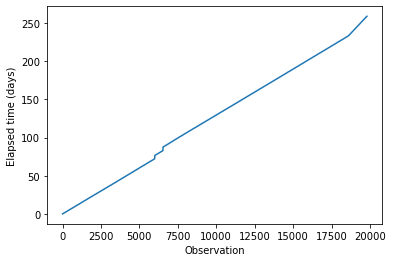

In [90]:
plt.plot(np.array(elapsed_time)/datetime.timedelta(days = 1));
plt.xlabel('Observation');
plt.ylabel('Elapsed time (days)');
plt.savefig('timeplot.pdf')

This type of exploration of data really helps understand your dataset more thoroughly

## 4.2.5: Calculating Daily Mean Speed
***
- Learn how to calculate and plot __daily mean speed__

Our next goal is to create a plot where on the y-axis, we have the mean daily speed and on the x-axis we have time (in days)


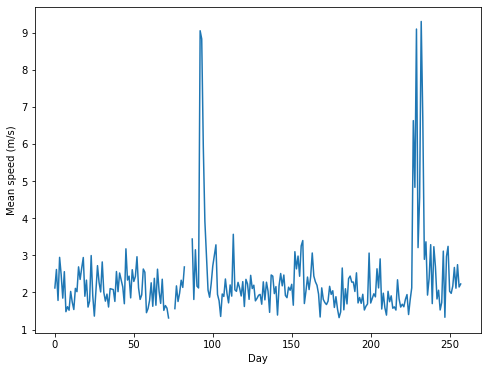

In [95]:
data = birddata[birddata.bird_name == 'Eric']
times = data.timestamp
elapsed_time = [time - times[0] for time in times]
elapsed_days = np.array(elapsed_time)/datetime.timedelta(days = 1)

next_day = 1
inds = []
daily_mean_speed = []

#loop over elapsed days
for (i,t) in enumerate(elapsed_days):
    #Have I hit the next day? If not, keep collecting indices
    if t < next_day:
        inds.append(i)
    else:
        #compute mean speed
        daily_mean_speed.append(np.mean(data.speed_2d[inds]))
        #increase next_day by 1 and reset inds 
        next_day +=1
        inds = []

#plotting it
plt.figure(figsize = (8,6));
plt.plot(daily_mean_speed)
plt.xlabel('Day');
plt.ylabel('Mean speed (m/s)');
plt.savefig('dms.pdf');


There seems to be two periods where Eric is flying substantialy more (corresponding to his migration patterns). This is around day 95 and 230ish. Now we want to find out where he migrates from, and where he ends up

In [112]:
# QUESTION 1:
# Read in the bird_tracking.csv data (provided along with Video 4.2.1) and take a look at Sanne's flight times. Which is the earliest recorded timestamp in the dataset for Sanne?
# sanne_data = birddata[birddata.bird_name == 'Sanne']
sanne_times = birddata.timestamp[birddata.bird_name == 'Sanne']
sanne_times = sanne_times.reset_index(drop=True)
sanne_times[0]


Timestamp('2013-08-15 00:01:08')

## 4.2.6: Using the Cartopy Library
***
- Learn how to __download and install Cartopy__, a library that provides cartographic tools for Python
- Learn how to use Cartopy to plot data on a __cartographic projection__

Cartopy is a library that provides cartographic tools for Python, that seems to work well across platforms

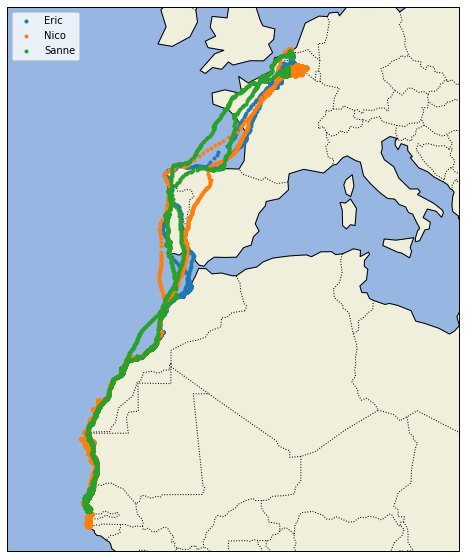

In [120]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

proj = ccrs.Mercator()

plt.figure(figsize = (10,10));
ax = plt.axes(projection = proj);
ax.set_extent((-25.0, 20.0, 52.0, 10.0));
#superimpose a map
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle = ':')

for name in bird_names:
    ix = birddata['bird_name'] == name
    x, y = birddata.longitude[ix], birddata.latitude[ix]
    ax.plot(x,y, '.', transform = ccrs.Geodetic(), label = name);

plt.legend(loc = 'upper left');
plt.savefig('map.pdf');